This is the tutorial from scanpy using pbmc 3K.
https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import celltypist
from celltypist import models
import scvi
import matplotlib.pyplot as plt
import seaborn as sns

import os

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

## download celltypist models
# get the low-immune (low-level on ontology, high-resolution)
model_str_low = 'Immune_All_Low.pkl'
model_str_high = 'Immune_All_High.pkl'
models.download_models(model = [model_str_low, model_str_high])




Global seed set to 0
OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
📂 Storing models in /beevol/home/davidson/.celltypist/data/models
💾 Total models to download: 2
⏩ Skipping [1/2]: Immune_All_Low.pkl (file exists)
⏩ Skipping [2/2]: Immune_All_High.pkl (file exists)


scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.19.5 scipy==1.7.1 pandas==1.3.3 scikit-learn==1.0 statsmodels==0.13.0 python-igraph==0.9.8 louvain==0.7.1 pynndescent==0.5.5


## Open files

In [3]:
data_path = f"{os.getcwd()}/../../data/single_cell_data/pbmc68k/hg19/"

results_file = f"{data_path}/pbmc68k.h5ad"

adata = sc.read_10x_mtx(
    data_path,                               # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                              # write a cache file for faster subsequent reading

adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`
adata.obs['bulk_labels'] = pd.read_csv(f"{data_path}/zheng17_bulk_lables.txt", header=None)[0].values

... reading from cache file cache/beevol-home-davidson-checkouts-sc_bulk_ood-evaluation_experiments-pbmc68k-..-..-data-single_cell_data-pbmc68k-hg19-matrix.h5ad


In [4]:
ref_data_path = f"{os.getcwd()}/../../data/reference_data/celltypist_encyclopedia/"
marker_curated_file = f"{ref_data_path}/encyclopedia_table_celltypist_low_curated.csv"
marker_top10_file = f"{ref_data_path}/encyclopedia_table_celltypist_low_top10importance.csv"

# read in the marker genes for scVI
marker_curated = pd.read_csv(marker_curated_file, sep="\t", index_col=0)
marker_top10 = pd.read_csv(marker_top10_file, sep="\t", index_col=0)

In [5]:
# make cell type specific marker annotation

genes_annot_dict = {
    'CD14': ['CD14 (CD14 Mono)'],
    'LYZ': ['LYZ (CD14 Mono)'],
    'FCGR3A': ['FCGR3A (CD16 Mono)'],
    'MS4A7': ['MS4A7 (CD16 Mono)'],
    'FCER1A': ['FCER1A (Dendritic)'],
    'CST3': ['CST3 (Dendritic)'],
    'GNLY': ['GNLY (NK)'],
    'NKG7': ['NKG7 (NK)'],
    'MS4A1': ['MS4A1 (B cell)'],
    'CD79A': ['CD79A (B cell)'],
    'IL7R': ['IL7R (CD4T)'],
    'CCR7': ['CCR7 (Naive CD4T)'],
    'S100A4': ['S100A4 (Memory CD4T)'],
    'CD8A': ['CD8A (CD8 T)'],
    'PPBP': ['PPBP (Megak)']
}



# Initialize empty column in cell metadata
adata.var['gene_annot'] = adata.var_names

# Generate new assignments
for i in genes_annot_dict.keys():
    ind = np.where(pd.Series(adata.var_names).isin([i]))[0]
    adata.var['gene_annot'].iloc[ind] = genes_annot_dict[i]
adata.var['gene_annot'].iloc[ind]

PPBP    PPBP (Megak)
Name: gene_annot, dtype: object

## Preprocessing

In [6]:
# lets see whats in adata
adata

AnnData object with n_obs × n_vars = 68579 × 32738
    obs: 'bulk_labels'
    var: 'gene_ids', 'gene_annot'

normalizing counts per cell
    finished (0:00:00)


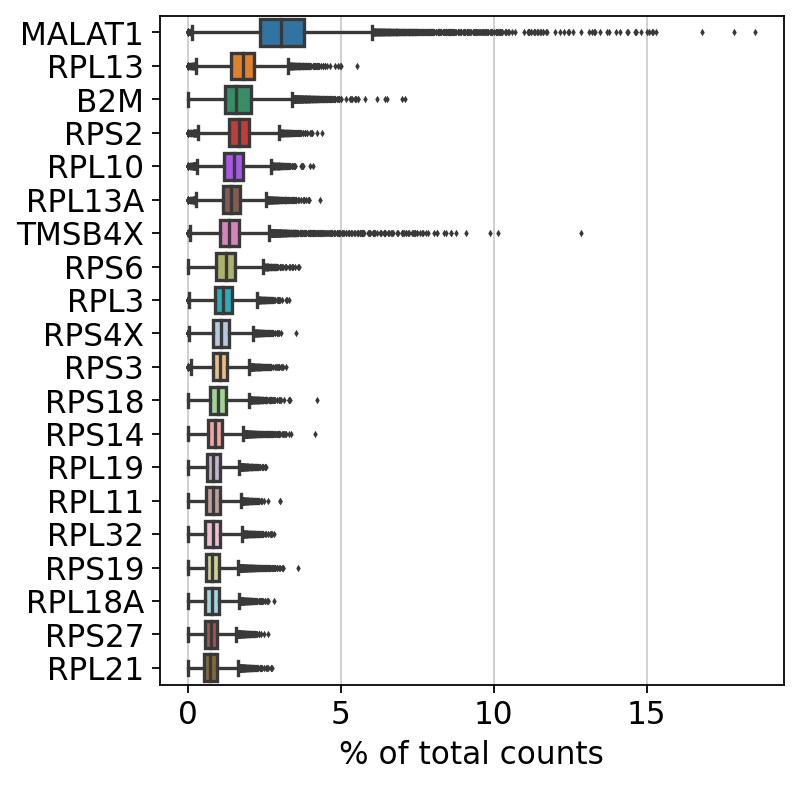

In [7]:
sc.pl.highest_expr_genes(adata, n_top=20, )


In [8]:
# filter out cells with less than 200 genes and genes expressed in less than 3 cells
sc.pp.filter_cells(adata, min_genes=500)
sc.pp.filter_genes(adata, min_cells=5)

filtered out 27818 cells that have less than 500 genes expressed
filtered out 16682 genes that are detected in less than 5 cells


... storing 'bulk_labels' as categorical


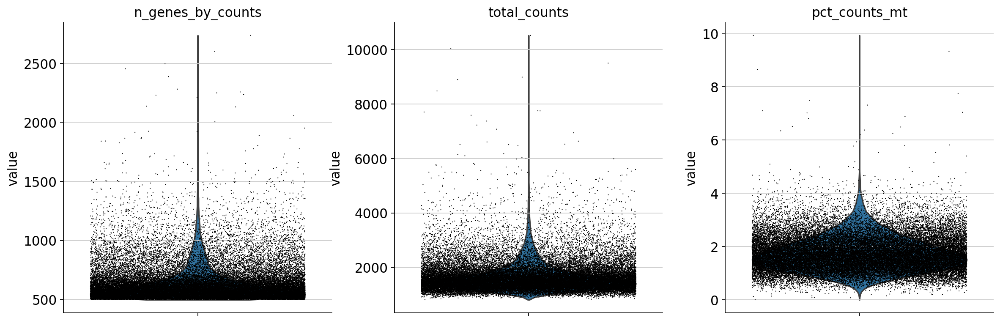

In [9]:
# remove genes with high mitochondrial content
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

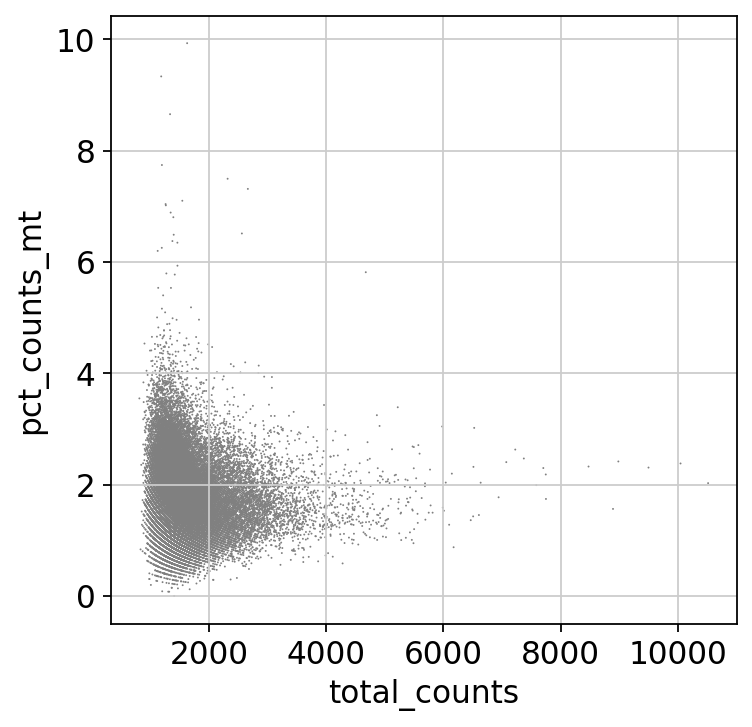

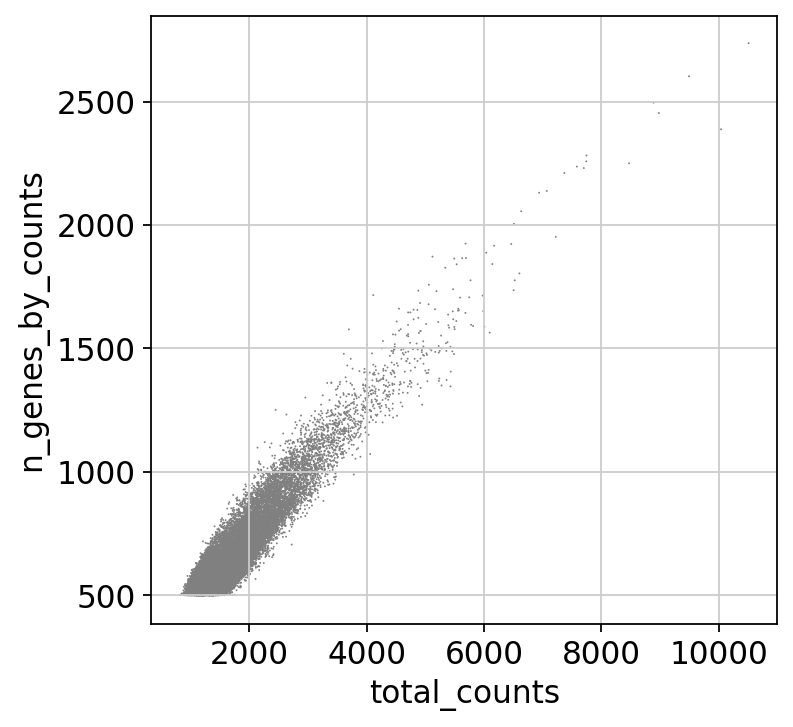

In [10]:
plt.rcParams['figure.figsize'] = [5, 5]

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [11]:
# slice the data based on the plots from above
# remove cells with more than 2500 genes
# remove cells with more than 5% MTgenes
adata = adata[adata.obs.n_genes_by_counts < 1500, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


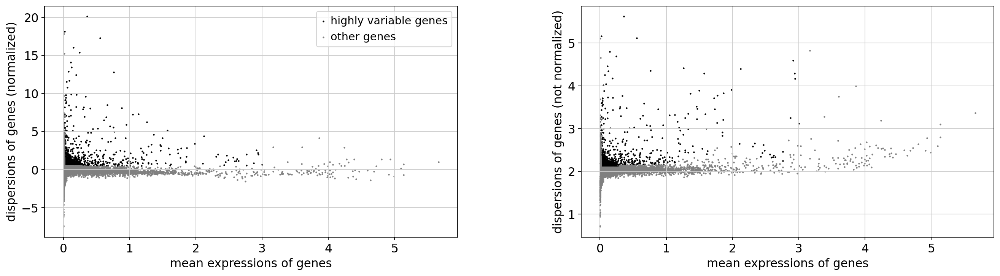

In [12]:
plt.rcParams['figure.figsize'] = [10, 5]

# normalize to 10K counts per cell
sc.pp.normalize_total(adata, target_sum=1e4)

# log data
sc.pp.log1p(adata)

# get high variance genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

# and plot
sc.pl.highly_variable_genes(adata)

# now store the raw version of the data for our use later
adata.raw = adata
adata.write(results_file)



In [13]:
adata

AnnData object with n_obs × n_vars = 40635 × 16056
    obs: 'bulk_labels', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'gene_annot', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

### Run celltypist

In [14]:
celltype_pred_low = celltypist.annotate(adata, model = model_str_low, majority_voting = True)
celltype_pred_high = celltypist.annotate(adata, model = model_str_high, majority_voting = True)

🔬 Input data has 40635 cells and 16056 genes
🔗 Matching reference genes in the model
🧬 1579 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Can not detect a neighborhood graph, construct one before the over-clustering


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:07)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:27)


⛓️ Over-clustering input data with resolution set to 20


running Leiden clustering
    finished: found 622 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:21)


🗳️ Majority voting the predictions
✅ Majority voting done!
🔬 Input data has 40635 cells and 16056 genes
🔗 Matching reference genes in the model
🧬 1200 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20


running Leiden clustering
    finished: found 622 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:20)


🗳️ Majority voting the predictions
✅ Majority voting done!


In [15]:
tcell_idx = np.where(celltype_pred_low.predicted_labels['majority_voting'] == "T cells")
for idx in tcell_idx[0][0:10]:
    idx_sort = np.flip(np.argsort(celltype_pred_low.probability_matrix.iloc[idx,:]))
    print(celltype_pred_low.probability_matrix.iloc[idx,idx_sort[0:2]])



Regulatory T cells             0.197384
Tem/Effector helper T cells    0.140317
Name: AAAGAGACGTTACG-1, dtype: float64
Tem/Effector cytotoxic T cells    0.634487
Helper T cells                    0.406681
Name: AAGGCTACAACGAA-1, dtype: float64
T cells                        0.184891
Tem/Effector helper T cells    0.058013
Name: AAGGCTACAAGATG-1, dtype: float64
Tem/Effector helper T cells    0.772518
Tcm/Naive cytotoxic T cells    0.246856
Name: ACCACGCTCTGATG-1, dtype: float64
Helper T cells                 0.863359
Tem/Effector helper T cells    0.447650
Name: AGCACAACACAGTC-1, dtype: float64
Tem/Effector helper T cells    0.451470
Tcm/Naive cytotoxic T cells    0.138201
Name: AGCGAACTCTTTAC-1, dtype: float64
T cells                        0.687831
Tem/Effector helper T cells    0.300635
Name: AGCGCTCTTTCCCG-1, dtype: float64
Helper T cells                 0.736272
Tem/Effector helper T cells    0.727240
Name: AGTCGAACACCAAC-1, dtype: float64
T cells                        0.402329
Tc

In [16]:
tcell_idx = np.where(celltype_pred_low.predicted_labels['majority_voting'] == "T cells")
tcell_idx[0][0:10]

array([  42,  269,  270,  528,  939,  989, 1010, 1204, 1218, 1430])

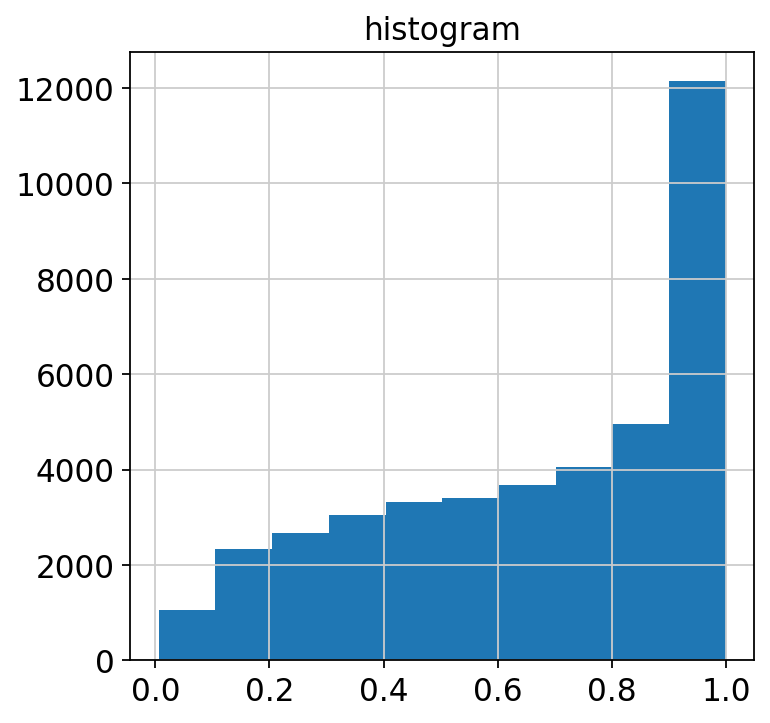

In [17]:
plt.rcParams['figure.figsize'] = [5, 5]

maxValues = celltype_pred_low.probability_matrix.max(axis = 1)
hist, bins = np.histogram(maxValues)
plt.hist(maxValues, bins = bins) 
plt.title("histogram") 
plt.show()

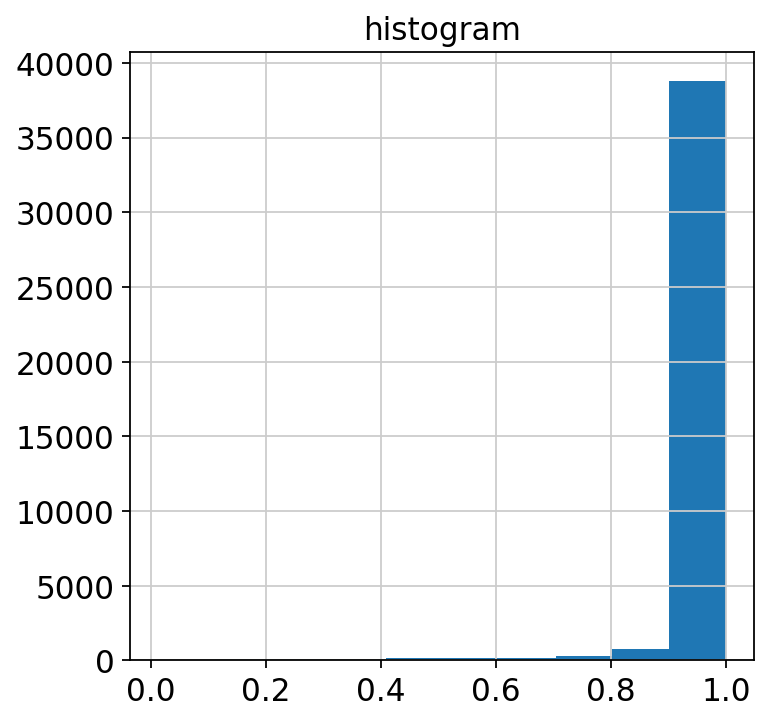

In [18]:
maxValues = celltype_pred_high.probability_matrix.max(axis = 1)
hist, bins = np.histogram(maxValues)
plt.hist(maxValues, bins = bins) 
plt.title("histogram") 
plt.show()

In [19]:
celltype_pred_low.predicted_labels['majority_voting'].value_counts()

Tcm/Naive cytotoxic T cells       20185
Tem/Effector helper T cells        7070
Tem/Effector cytotoxic T cells     5354
CD16+ NK cells                     2700
B cells                            1731
Non-classical monocytes            1621
DC                                  611
Regulatory T cells                  536
NK cells                            216
Classical monocytes                 175
T cells                             146
pDC                                 134
Plasma cells                         67
Cytotoxic T cells                    60
Megakaryocytes/platelets             29
Name: majority_voting, dtype: int64

In [20]:
celltype_pred_high.predicted_labels['majority_voting'].value_counts()

T cells                     33867
ILC                          2636
Monocytes                    1796
B cells                      1495
DC                            491
pDC                           134
Macrophages                   120
Plasma cells                   67
Megakaryocytes/platelets       29
Name: majority_voting, dtype: int64

## Run CellAssign

In [26]:
# get the library size
lib_size = adata.X.sum(1)
adata.obs["size_factor"] = lib_size / np.mean(lib_size)

# we first must smake sure we are only querying with the genes that 
# are in both the cell type and adata files
genes_keep_cur = np.intersect1d(marker_curated.index, adata.var_names)
marker_curated = marker_curated.loc[genes_keep_cur]


genes_keep_top10 = np.intersect1d(marker_top10.index, adata.var_names)
marker_top10 = marker_top10.loc[genes_keep_top10]


# subset adata to only the genes used in the prediction
adata_curated = adata[:, marker_curated.index].copy()
adata_top10 = adata[:, marker_top10.index].copy()



In [28]:
from scvi.external import CellAssign

from pathlib import Path
celllassign_res_file = Path(f"{os.getcwd()}/../../data/temp/pbmc68_model_curated.pkl")
if celllassign_res_file.is_file():
    predictions = pd.read_pickle(celllassign_res_file)
else:
    # now we will begin the fit
    scvi.external.CellAssign.setup_anndata(adata_curated, size_factor_key="size_factor")
    scvi.external.CellAssign.setup_anndata(adata_top10, size_factor_key="size_factor")


    model_curated = CellAssign(adata_curated, marker_curated)
    model_curated.train()

    model_top10 = CellAssign(adata_top10, marker_top10)
    model_top10.train()

    predictions = model_curated.predict()


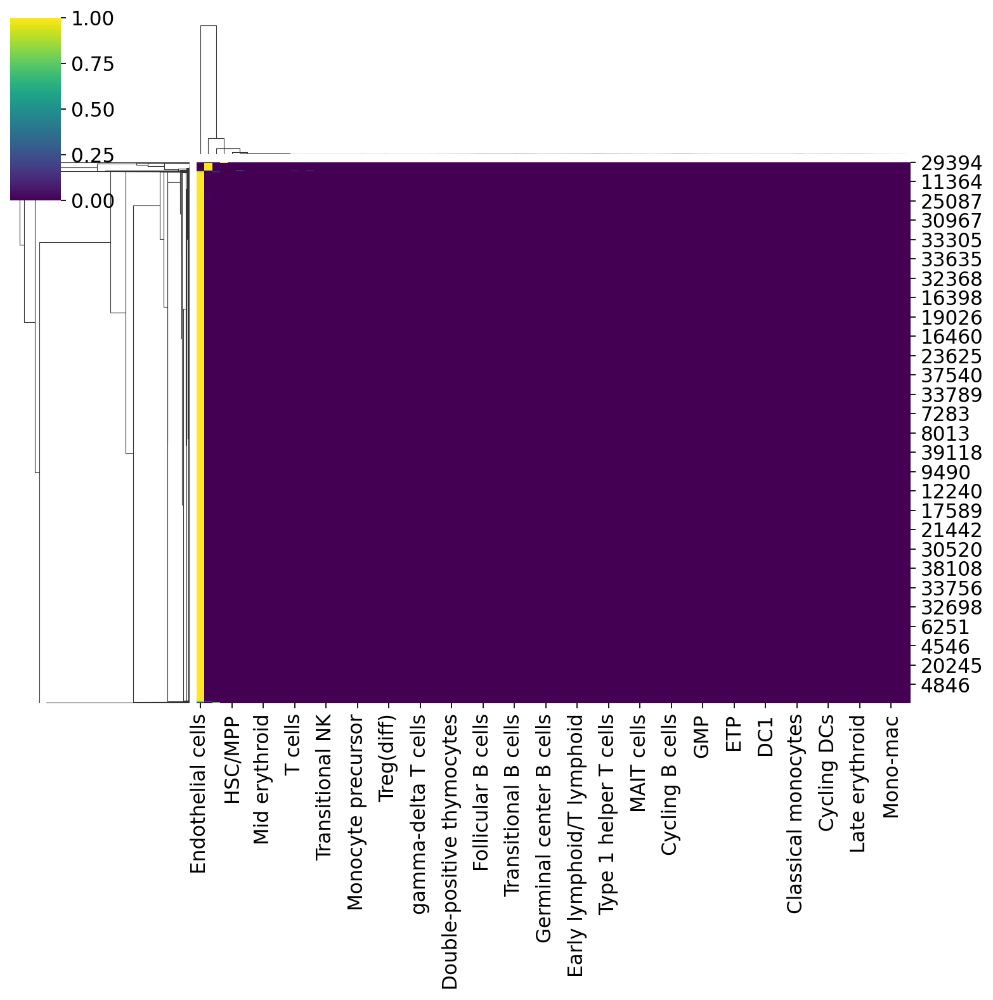

In [29]:
sns.clustermap(predictions, cmap="viridis")


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:48)


... storing 'scvi-tools predictions' as categorical


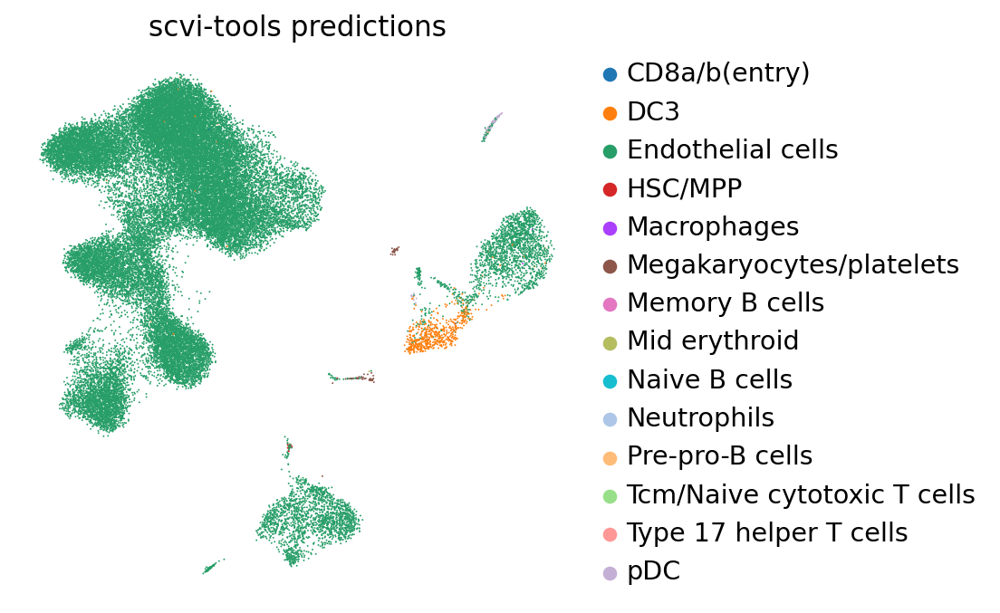

In [30]:

adata_curated.obs["scvi-tools predictions"] = predictions.idxmax(axis=1).values
sc.tl.umap(adata_curated)
sc.pl.umap(
    adata_curated,
    color=["scvi-tools predictions"],
    frameon=False,
    ncols=1
)

In [31]:
# now process the counts further for doing DE 
# analysis and the cell clustering
adata = celltype_pred_low.to_adata() # doesnt matter if its high or low
adata = adata[:, adata.var.highly_variable]

# regress out the signal
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

# scale the genes
sc.pp.scale(adata, max_value=10)


regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:46)


## PCA

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:06)


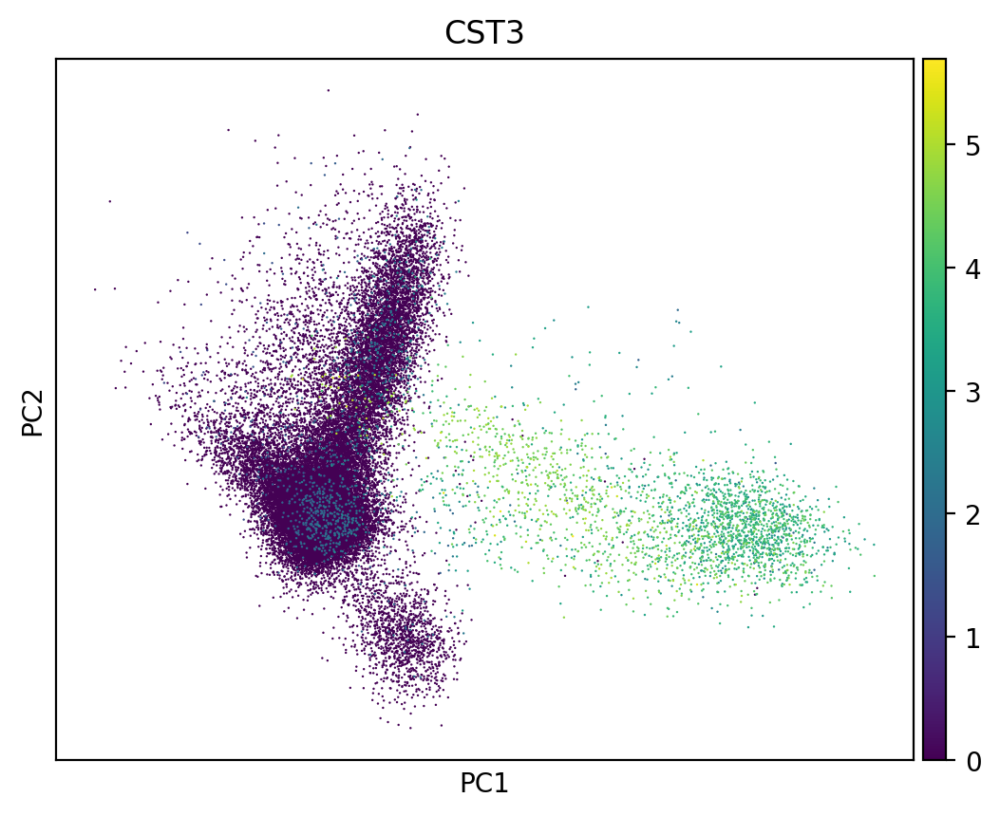

In [48]:
plt.rcParams.update(plt.rcParamsDefault)
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata, color='CST3')


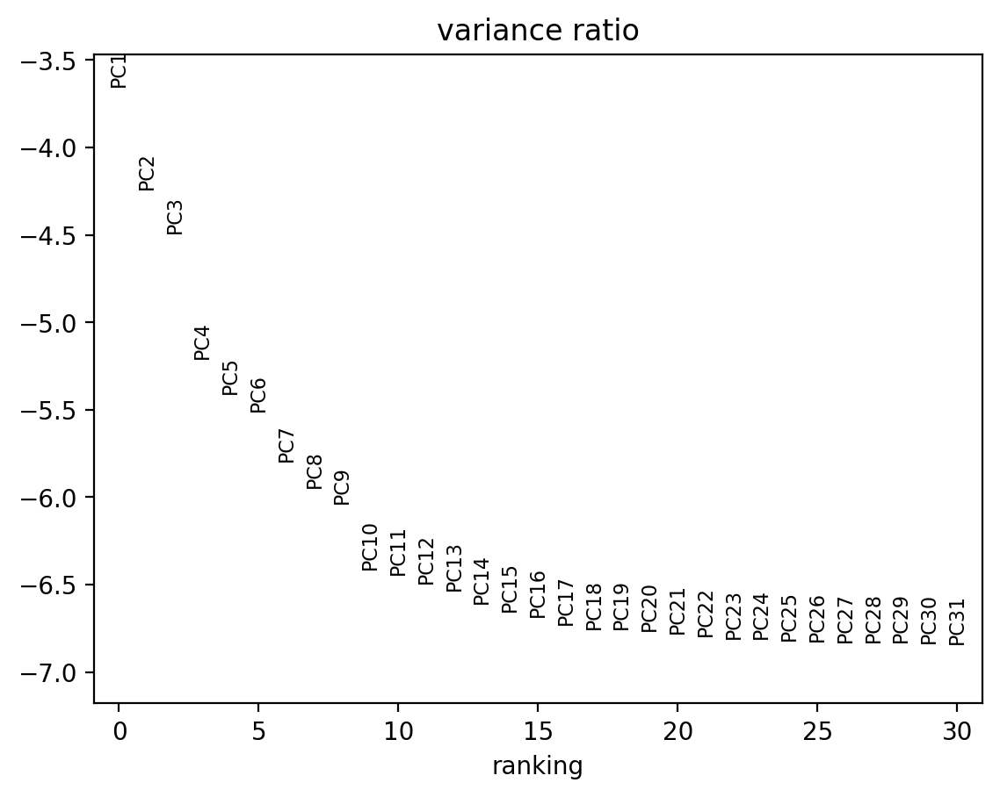

In [49]:
sc.pl.pca_variance_ratio(adata, log=True)


In [50]:
# save results
adata.write(results_file)


## Compute and embed neighborhood graph

In [51]:
# valculate neighborhood graph
sc.pp.neighbors(adata)

# make umap
sc.tl.umap(adata)


computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:59)


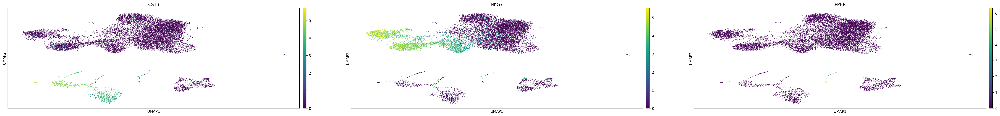

In [52]:
# plot some markers of the RAW data
plt.rcParams['figure.figsize'] = [15, 5]

sc.pl.umap(adata, color=['CST3', 'NKG7', 'PPBP'])


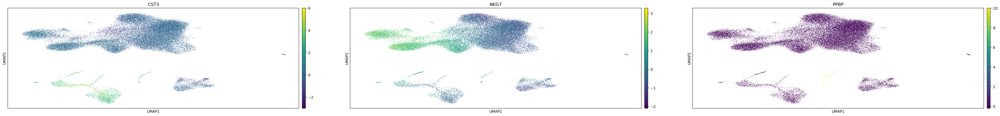

In [53]:
# now plot the corrected version (scaled+regressed)
sc.pl.umap(adata, color=['CST3', 'NKG7', 'PPBP'], use_raw=False)


## Cluster the neighborhood graph

running Leiden clustering
    finished: found 16 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:12)


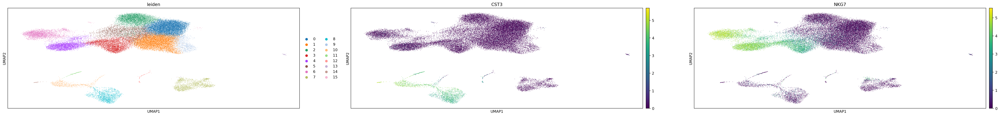

In [54]:
# lets use Leiden clustering
sc.tl.leiden(adata)
sc.pl.umap(adata, color=['leiden', 'CST3', 'NKG7'])

# save
adata.write(results_file)


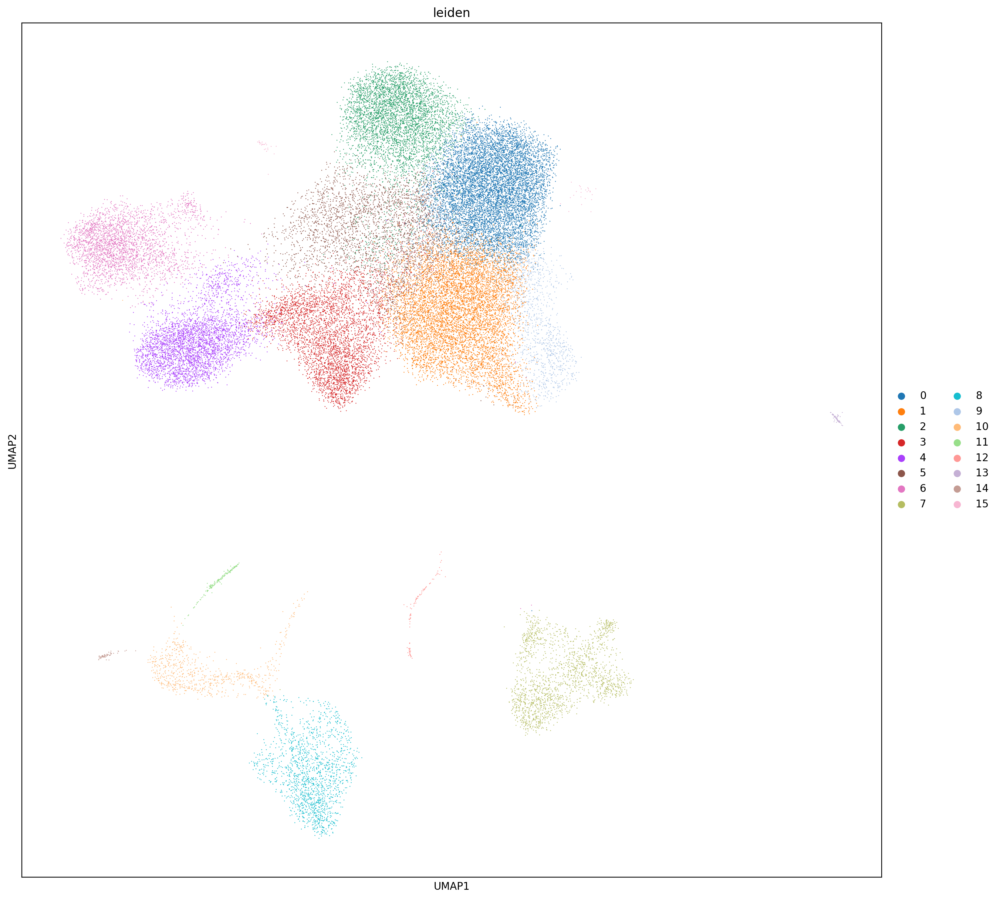

In [55]:
adata.obs['celltypist_low'] = celltype_pred_low.predicted_labels['majority_voting']
adata.obs['celltypist_high'] = celltype_pred_high.predicted_labels['majority_voting']

plt.rcParams['figure.figsize'] = [15, 15]
sc.pl.umap(adata, color=['leiden'])


In [56]:
celltype_pred_low.predicted_labels['predicted_labels']

AAACATACCGGAGA-1       Tem/Effector helper T cells
AAACATACTGTCTT-1                           T cells
AAACATACTTCTAC-1                    CD16+ NK cells
AAACATTGCTTCGC-1    Tem/Effector cytotoxic T cells
AAACATTGGTTCAG-1                    Helper T cells
                                 ...              
TTTGACTGTCGTTT-8       Tem/Effector helper T cells
TTTGACTGTGCTAG-8       Tcm/Naive cytotoxic T cells
TTTGCATGCTAGCA-8       Tcm/Naive cytotoxic T cells
TTTGCATGCTGCAA-8       Tcm/Naive cytotoxic T cells
TTTGCATGTGGTAC-8       Tem/Effector helper T cells
Name: predicted_labels, Length: 40635, dtype: category
Categories (53, object): ['B cells', 'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', ..., 'Transitional NK', 'Treg(diff)', 'Type 17 helper T cells', 'pDC']

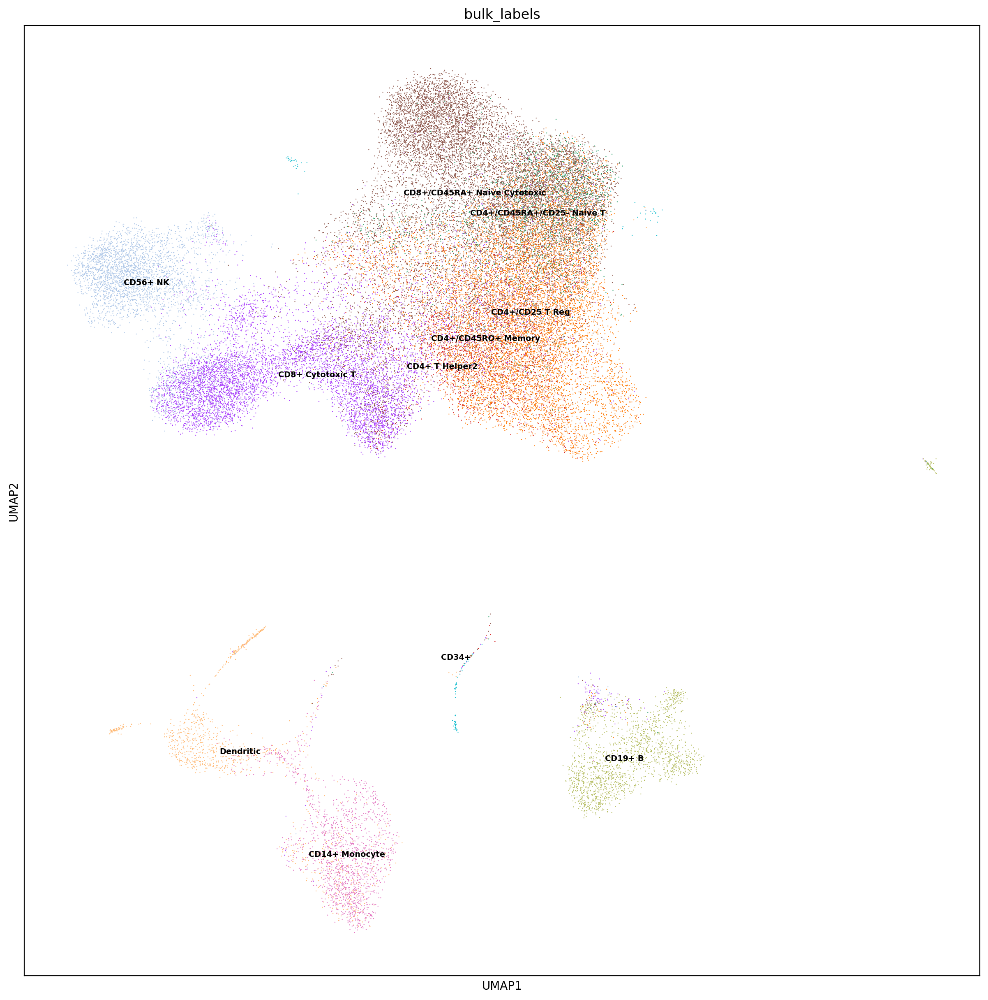

In [57]:
plt.rcParams['figure.figsize'] = [15, 15]
sc.pl.umap(adata, color=['bulk_labels'], legend_loc='on data', legend_fontsize="x-small")


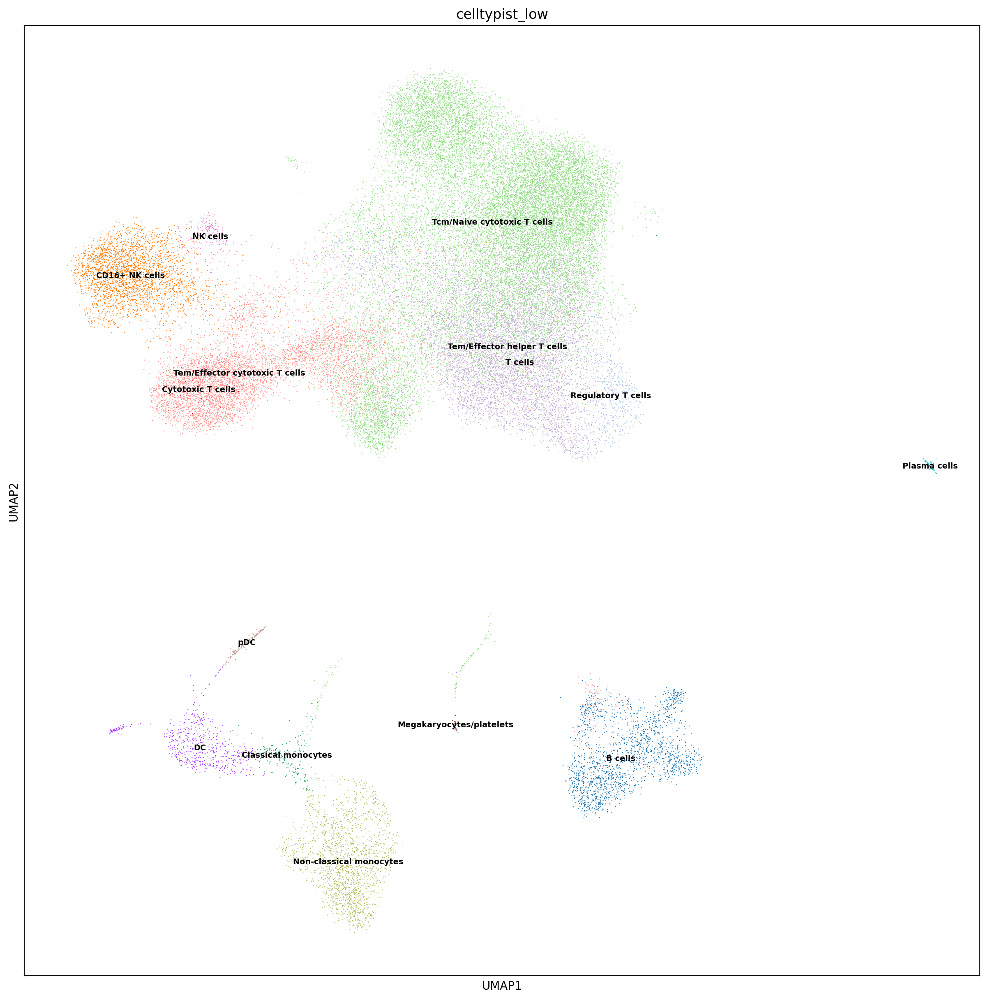

In [58]:
plt.rcParams['figure.figsize'] = [15, 15]
sc.pl.umap(adata, color=['celltypist_low'], legend_loc='on data', legend_fontsize="x-small")


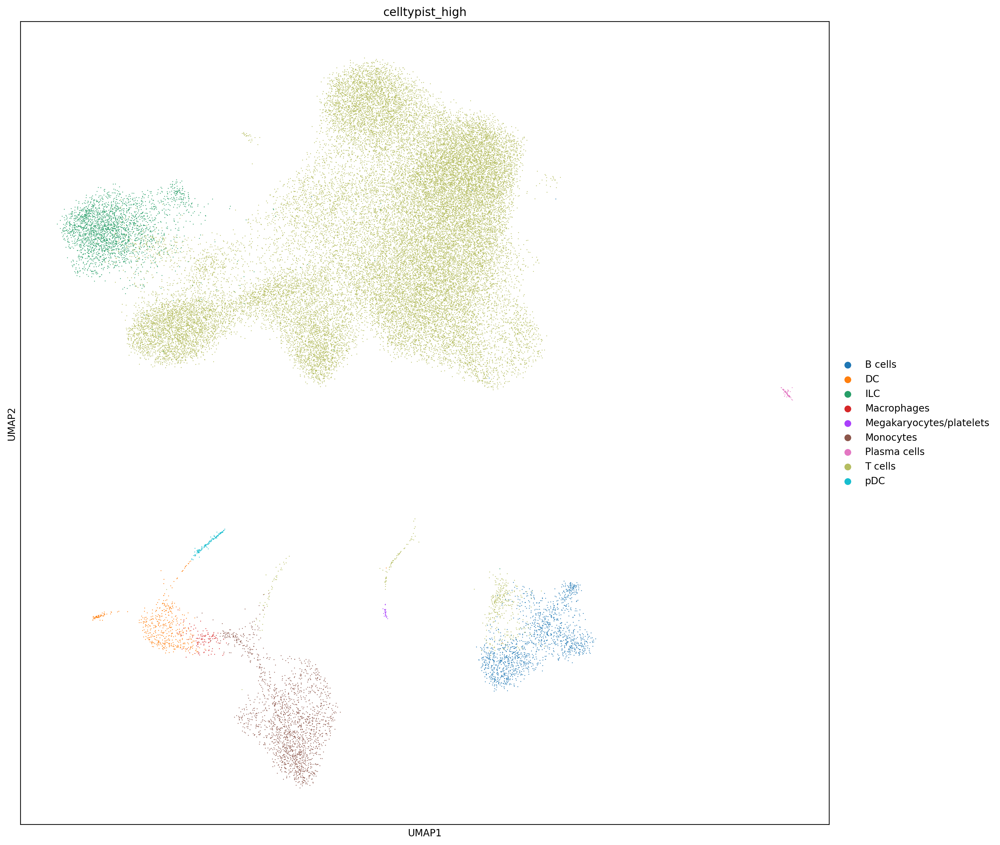

In [59]:
sc.pl.umap(adata, color=['celltypist_high'])


In [60]:
compare_ct = adata.obs[['celltypist_low', 'bulk_labels']].groupby(['celltypist_low', 'bulk_labels'])
compare_ct = compare_ct.size()
compare_ct.unstack()

bulk_labels,CD4+ T Helper2,CD4+/CD25 T Reg,CD4+/CD45RA+/CD25- Naive T,CD4+/CD45RO+ Memory,CD8+ Cytotoxic T,CD8+/CD45RA+ Naive Cytotoxic,CD14+ Monocyte,CD19+ B,CD34+,CD56+ NK,Dendritic
celltypist_low,,,,,,,,,,,
B cells,2,26,4,0,14,11,0,1672,1,0,1
CD16+ NK cells,0,0,0,0,80,1,0,0,0,2619,0
Classical monocytes,0,0,0,0,0,0,106,0,0,0,69
Cytotoxic T cells,0,0,0,0,44,0,0,0,0,16,0
DC,0,0,0,0,0,0,31,0,0,0,580
Megakaryocytes/platelets,0,0,0,0,0,0,0,0,29,0,0
NK cells,0,1,0,0,45,3,0,0,0,167,0
Non-classical monocytes,0,1,0,0,10,0,1304,0,0,3,303
Plasma cells,0,0,6,0,2,0,1,58,0,0,0


In [61]:
compare_ct = adata.obs[['celltypist_high', 'bulk_labels']].groupby(['celltypist_high', 'bulk_labels'])
compare_ct = compare_ct.size()
compare_ct.unstack()

bulk_labels,CD4+ T Helper2,CD4+/CD25 T Reg,CD4+/CD45RA+/CD25- Naive T,CD4+/CD45RO+ Memory,CD8+ Cytotoxic T,CD8+/CD45RA+ Naive Cytotoxic,CD14+ Monocyte,CD19+ B,CD34+,CD56+ NK,Dendritic
celltypist_high,,,,,,,,,,,
B cells,0,9,3,0,10,2,0,1469,1,0,1
DC,0,0,0,0,0,0,1,0,0,0,490
ILC,0,1,0,0,62,3,0,0,0,2570,0
Macrophages,0,0,0,0,0,0,30,0,0,0,90
Megakaryocytes/platelets,0,0,0,0,0,0,0,0,29,0,0
Monocytes,0,1,0,0,10,0,1410,0,0,3,372
Plasma cells,0,0,6,0,2,0,1,58,0,0,0
T cells,12,9426,1760,2304,6821,12136,15,210,79,1031,73
pDC,0,1,0,0,2,0,0,0,0,1,130


In [62]:
compare_ct = adata.obs[['celltypist_low', 'celltypist_high']].groupby(['celltypist_low', 'celltypist_high'])
compare_ct = compare_ct.size()
compare_ct.unstack()

celltypist_high,B cells,DC,ILC,Macrophages,Megakaryocytes/platelets,Monocytes,Plasma cells,T cells,pDC
celltypist_low,,,,,,,,,
B cells,1495,0,0,0,0,0,0,236,0
CD16+ NK cells,0,0,2420,0,0,0,0,280,0
Classical monocytes,0,0,0,0,0,175,0,0,0
Cytotoxic T cells,0,0,0,0,0,0,0,60,0
DC,0,491,0,120,0,0,0,0,0
Megakaryocytes/platelets,0,0,0,0,29,0,0,0,0
NK cells,0,0,216,0,0,0,0,0,0
Non-classical monocytes,0,0,0,0,0,1621,0,0,0
Plasma cells,0,0,0,0,0,0,67,0,0
